![Astrofisica Computacional](../../../logo.PNG)

---
## 01. Problema de N-cuerpos I. 

Eduard Larrañaga (ealarranaga@unal.edu.co)

---


### Resumen

En este cuaderno se implementará un algoritmo para solucionar el problema de los N-cuerpos y se aplicará al caso particular de 2 cuerpos Tierra-Sol.

`A. Garcia. Numerical Methods for Physics. (1999). Chapter 3 `

---

## El Sistema Gravitacional de  N-Cuerpos

Las ecuaciones de movimiento de N-cuerpos moviendose bajo la influencia gravitacional mutua están dadas por un conjunto de $N$ ecuaciones diferenciales vectoriales de segundo orden,

\begin{equation}
m_i \ddot{\vec{x}}_i = - G m_i \sum_{j=1,i\ne j}^N \frac{m_j}{|\vec{x}_{ij}|^3} \vec{x}_{ij},
\end{equation}

donde $\vec{x}_{ij} = \vec{x}_i - \vec{x}_j$ es el vector que apunta desde la partícula  $j$ a la partícula $i$. 

Este sistema diferencial de segundo orden se puede escribir como un conjunto de $2N$ ecuaciones diferenciales vecotirales de primer orden,

\begin{align}
\begin{cases}
\frac{d \vec{x}_i}{dt} = &\vec{v}_i \\
\frac{d\vec{v}_i}{dt} = &- G \sum_{j=1,i\ne j}^N \frac{m_j}{|\vec{x}_{ij}|^3} \vec{x}_{ij}.
\end{cases}
\end{align}

Las ecuaciones vectoriales se pueden escribir en términos de unas componentes cartesianas para la posición $\vec{x} = (x,y,z)$ y para la velocidad $\vec{v} = (v^x, v^y, v^z)$,

\begin{align}
\begin{cases}
\frac{d x_i}{dt} = &v^x_i \\
\frac{d y_i}{dt} = &v^y_i \\
\frac{d z_i}{dt} = &v^z_i \\
\frac{dv^x_i}{dt} = &- G \sum_{j=1,i\ne j}^N \frac{m_j (x_i - x_j)}{r_{ij}^3} \\
\frac{dv^y_i}{dt} = &- G \sum_{j=1,i\ne j}^N \frac{m_j (y_i - y_j)}{r_{ij}^3} \\
\frac{dv^z_i}{dt} = &- G \sum_{j=1,i\ne j}^N \frac{m_j (z_i - z_j)}{r_{ij}^3} 
\end{cases}
\end{align}

dodne $|\vec{x}_{ij}| = \sqrt{(x_i - x_j)^2 + (y_i - y_j)^2+ (z_i - z_j)^2} = r_{ij}$.


---
## Implementación de las Ecuaciones de Movimiento

Un aspecto importante para tener en cuenta son los grandes números involucrados si se utiliza el Sistema Internacional de Unidades en un problema dentro del sistema solar. Para tener mejores resultados, se tomará un sistema con las siguientes unidades de medida 

- unidad de masa: masa Solar $(M_{\odot})$
- unidad de distancia: Unidad Astronómica $(\text{ au})$
- unidad de tiemo: año $(yr)$

En este sistema de unidades, la constante gravitacional Newtoniana tiene el valor $G = 4\pi^2$.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d as Axes3D
%matplotlib notebook   


# Relevant Constants in the units
# (years, AU, Solar_masses)
# Newtonian Gravitational Constant
G = 4.*np.pi**2

# Conversion factors
m_Sun = 1.98855e30 # Solar mass in kg
au_in_meters = 1.49598261e11 # 1 au in meters
year_in_seconds = 3600*24*365 # 1 year in seconds

El sistema de ODEs se implementa mediante la función

In [2]:
def ODE(t0, q0):
    '''
    ------------------------------------------
    ODE(t,q0) 
    ------------------------------------------
    ODEs system for the motion of N-particles 
    
    Arguments:
    t0: time parameter (not necessary for 
        the Newtonian problem)
    q0: numpy array with the initial condition
        data:
        q0[0] = particle 1
        q0[1] = particle 2
        etc.
        q0[0] = [x0, y0, z0, vx0, vy0, vz0]
    mass: masses of the particles
    ------------------------------------------
    '''
    q1 = np.zeros(q0.shape)
    q1[:,0:3] = q0[:,3:] # Components of the velocity
    
    for i in range(0,N):
        Deltaxyz = q0[i,0:3] - q0[:,0:3]
        # Distance between particles
        r = np.sqrt(np.sum(Deltaxyz*Deltaxyz,axis=1))
        # To avoid divivision by zero in the self-force terms
        # The terms vanish due to the Delta term in the numerator! 
        r[i] = 1 
        q1[i,3] = -G * np.sum(Deltaxyz[:,0] * mass/(r**3))
        q1[i,4] = -G * np.sum(Deltaxyz[:,1] * mass/(r**3))
        q1[i,5] = -G * np.sum(Deltaxyz[:,2] * mass/(r**3))
    return q1

## Conservación de la Energía

Ya que la energía mecánica total se conserva, se puede utilizar como un criterio para estudiar el procedimiento de integración.



\begin{equation}
E = \frac{1}{2} \sum_{i=1}^N m_i |\vec{v}_i|^2 -
 \frac{1}{2}G \sum_{i=1}^N \sum_{j=1,i\ne j}^N \frac{m_i m_j}{r_{ij}}
\end{equation}

In [3]:
def TotalEnergy(q0):
    '''
    Total Energy calculation
    '''
    (x,y,z,vx,vy,vz) = q0.transpose()
    v2 = vx**2+vy**2+vz**2
    Ekin = 0.5*np.sum(mass*v2)
    Egrav = 0.
    for i in range(0,N):
        deltax = x[i] - x
        deltay = y[i] - y
        deltaz = z[i] - z
        r = np.sqrt(deltax**2 + deltay**2 + deltaz**2)
        # To avoid divivision by zero and put the value of the term to zero!
        r[i] = 1e300 
    Egrav += - 0.5*G * mass[i] * np.sum(mass/r)
    return Ekin + Egrav

Se utilizará un integrador RK4 para resolver el problema,

In [4]:
def RK4(dt, t0, q0):
    '''
    ------------------------------------------
    RK4(h, t0, q0)
    ------------------------------------------
    4th Order Runge-Kutta method for solving 
    a system of ODEs.
    Arguments:
    ODE: function defining the system of ODEs
    h: stepsize for the iteration
    t0: independent parameter initial value
    q0: numpy array with the initial values of
        the functions in the ODEs system
    ------------------------------------------
    '''
    k1 = dt*ODE(t0, q0)
    k2 = dt*ODE(t0 + dt/2., q0 + k1/2.)
    k3 = dt*ODE(t0 + dt/2., q0 + k2/2.)
    k4 = dt*ODE(t0 + dt, q0 + k3)
    q1 = q0 + (k1 + 2.*k2 + 2.*k3 + k4)/6.
    return q1


In [5]:
# Velocity-Verlet Algorithm
def velVerlet(ODE, t0, q0, tf, dt):
    '''
    ------------------------------------------
    velVerlet(h, t0, q0)
    Velocity-Verlet method for solving 
    a system of ODEs.
    ------------------------------------------
    Arguments:
    ODE: function defining the system of ODEs
    t0: independent parameter initial value
    q0: numpy array with the initial values of
        the functions in the ODEs system
    tf: independent parameter final value
    n: Stepsize for the integration
    ------------------------------------------
    Dependences: NumPy
    ------------------------------------------
    '''
    d = int(len(q0)/2) # Dimension of the system 
    n = int((tf - t0)/dt) # Number of steps
    # Initial condition
    q = np.zeros([n,2*d+1])
    q[0,0] = t0
    q[0,1:] = q0
        
    for i in range(1,n):
        q[i,0] = q[i-1,0] + dt
        v_half = q[i-1,d+1:] + ODE(q[i-1,0], q[i-1,1:])[d:]*dt/2
        q[i,1:d+1] = q[i-1,1:d+1] + v_half*dt
        q[i,d+1:] = v_half + ODE(q[i,0], q[i,1:])[d:]*dt/2
    return q

--- 
##  Condición Inicial


Las condiciones inciales se leerán del archivo `sun_earth.dat`. Debido a que estos datos están reportados en el Sistema Internacional de Unidades (kg, m, s), estos deben ser transformados en el sistema de unidades definido arriba ($M_{\odot}$, ua, yr).

En cuanto a la malla de discretización, se considerará un intervalo de tiempo de  5 años dividido en 40000 puntos.

In [6]:
# Read the initial data
initial_data_file = "sun_earth.asc"
(x,y,z,vx,vy,vz,mass) = np.loadtxt(initial_data_file, unpack = True)

# Convert from SI units to (years, AU, Solar_Mass) units
x = x/au_in_meters
y = y/au_in_meters
z = z/au_in_meters
vx = vx*year_in_seconds/au_in_meters
vy = vy*year_in_seconds/au_in_meters
vz = vz*year_in_seconds/au_in_meters
mass = mass/m_Sun

# Number of particles
N = len(mass)

# Creation of the time grid (in years)
t_0 = 0.
t_f = 5.

# Number of steps in the grid
n = 40000

t_grid = np.linspace(t_0, t_f, n)

# Constant stepsize defined by the number of steps in the grid
dt = (t_f - t_0)/n


La información de la evolución del sistema se almacenará en un arreglo llamado `q`. Este tendrá las dimensiones 

 (Tamaño de la malla = n) x (número de partículas) x (posición+velocidad = 6)  = (n x N x 6)

In [8]:
# Array with the initial conditions for all particles
q = np.zeros([n, N, 6]) # array [steps, masses, 6 variables]
# Array with the information of total energy
energy = np.zeros(n)

q[0,:,0] = x
q[0,:,1] = y
q[0,:,2] = z
q[0,:,3] = vx
q[0,:,4] = vy
q[0,:,5] = vz
energy[0] = TotalEnergy(q[0])

## Loop Principal y Gráficos


En el loop principal se llama al método RK4 para actualizar los datos de posición, velocidad y energía del sistema. Los valores son guardados en el arreglo `q`, y con ello se realiza un gráfico 3D y se revisa la conservación de la energía.

In [9]:

for i in range(n-1):
  q[i+1] = RK4(dt, t_grid[i], q[i])
  energy[i+1] = TotalEnergy(q[i])


<IPython.core.display.Javascript object>


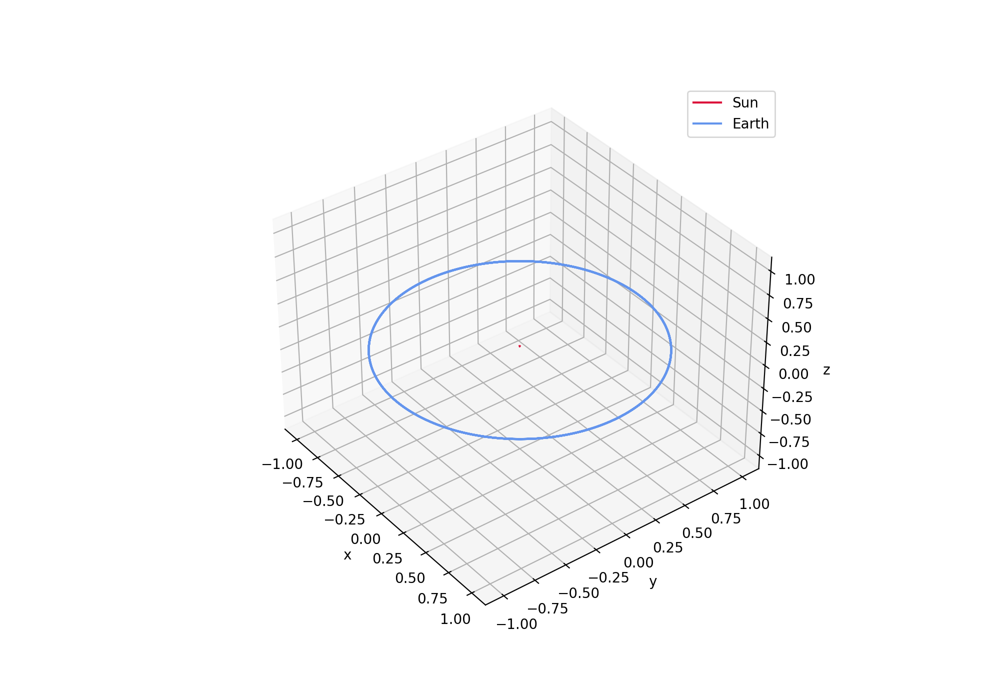

In [11]:
# Limits for the plot
boundary = max(abs(np.amax(q[:,:,0:3])), abs(np.amin(q[:,:,0:3])))*(1+0.1)

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(projection='3d')
ax.plot(q[:,0,0],q[:,0,1],q[:,0,2], color=('crimson'), label='Sun')
ax.plot(q[:,1,0],q[:,1,1],q[:,1,2], color=('cornflowerblue'), label='Earth')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_xlim3d(-boundary, boundary)
ax.set_ylim3d(-boundary, boundary)
ax.set_zlim3d(-boundary, boundary)
ax.legend()
plt.savefig('NBody-output.jpg')
plt.show()

In [12]:
energychange = (energy[n-1]-energy[0])/energy[0]
print(f'El cambio relativo en la energía es {energychange:.5E}% utilizando un tamaño del paso dt = {dt:.1E}')

El cambio relativo en la energía es -3.18599E-03% utilizando un tamaño del paso dt = 1.3E-04


---
## Gráfico interactivo utilizando  [Plotly](https://plotly.com)

Ahora se mostrará la orbita mediante un gráfico interactivo utilizando la función [plotly.graph_objects.Scatter3d()](https://plotly.com/python/reference/scatter3d/)

Algunos ejemplos del uso de esta función se pueden ver en https://plotly.com/python/3d-scatter-plots/ 

In [13]:
import plotly.graph_objects as go

# Orbits 
x1, y1, z1 = q[:,0,0],q[:,0,1],q[:,0,2] # Sun
x2, y2, z2 = q[:,1,0],q[:,1,1],q[:,1,2]


fig = go.Figure()
fig.add_trace(go.Scatter3d(x=x1, y=y1, z=z1,
                                   mode='markers',
                                   marker=dict(
                                       size=2,
                                       color='red'),
                                   name='Sun'))
fig.add_trace(go.Scatter3d(x=x2, y=y2, z=z2,
                                   mode='markers',
                                   marker=dict(
                                       size=1,
                                       color='blue'),
                                   name='Earth'))
fig.update_layout(
    scene = dict(
        xaxis = dict(nticks=5, range=[-boundary,boundary]),
        yaxis = dict(nticks=5, range=[-boundary,boundary]),
        zaxis = dict(nticks=5, range=[-boundary,boundary]),))
fig.show()